<a href="https://colab.research.google.com/github/ElGrandePadre/Spring2024STARepo/blob/main/Final_Project_Notebook_Matt_Stats_24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [ ]:
import matplotlib.pyplot as plt
import imageio
import torch
import torchvision
from torchvision import models, transforms
import numpy as np
from torchvision.models import *
from PIL import Image
import requests
from torchvision import models
from torchsummary import summary

In [ ]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x,cmap='gray')
    ax.axis('off')
    fig.set_size_inches(20, 20)
    plt.show()

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')

<ipython-input-2-2086ec9e0cf6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


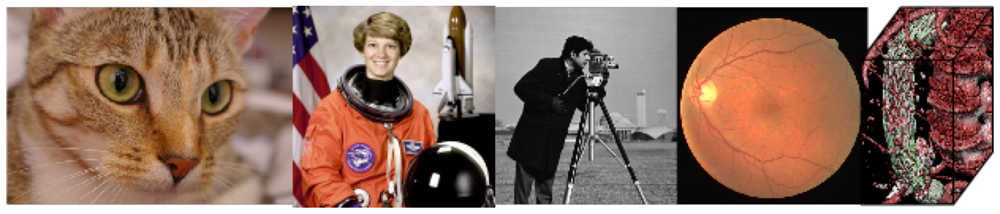

In [ ]:
plot(im)

In [ ]:
net = alexnet(pretrained=True).cuda(0)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 92.2MB/s]


In [ ]:
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406],
   std=[0.229, 0.224, 0.225]
)
preprocess = transforms.Compose([
   transforms.Resize(256),
   transforms.CenterCrop(224),
   transforms.ToTensor(),
   normalize
])

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')

<ipython-input-8-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


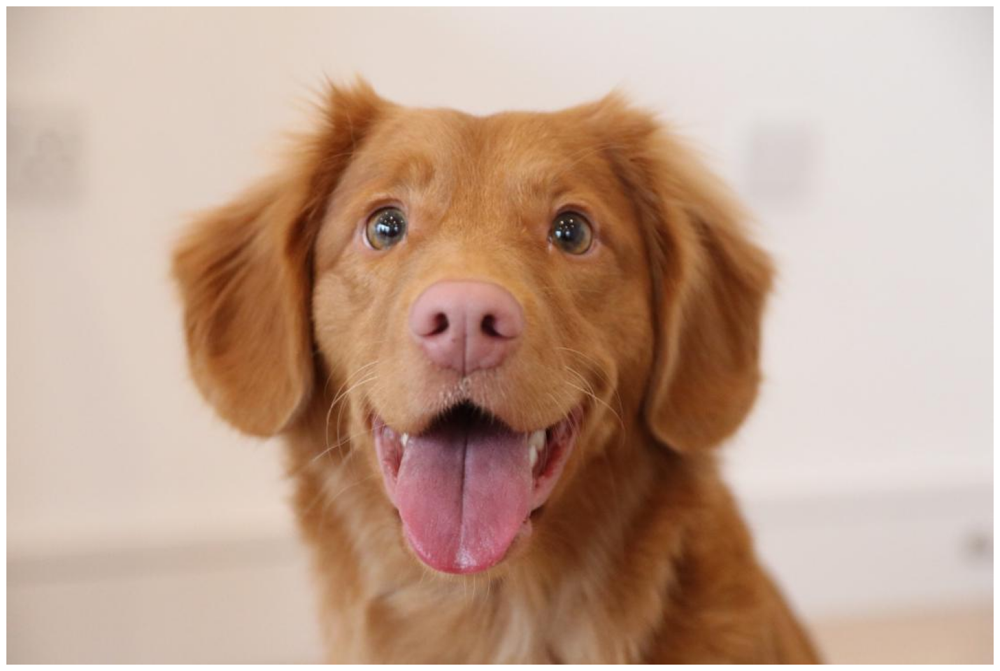

In [ ]:
plot(im)

In [ ]:
image = Image.fromarray(im) #convert to pil

In [ ]:
img_tensor = preprocess(image)

In [ ]:
img_tensor = img_tensor.unsqueeze_(0)

In [ ]:
img_tensor.shape

torch.Size([1, 3, 224, 224])

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0)

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
out = net(img_variable)

In [ ]:
label_index = out.cpu().data.numpy().argmax()

In [ ]:
label_index

220

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}

In [ ]:
print(labels[label_index])

Sussex spaniel


In [ ]:
for i in range(10):
    print(labels[top_list[i]])

Sussex spaniel
golden retriever
Brittany spaniel
cocker spaniel, English cocker spaniel, cocker
Blenheim spaniel
Irish setter, red setter
tennis ball
clumber, clumber spaniel
vizsla, Hungarian pointer
chow, chow chow


In [ ]:
net

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy()

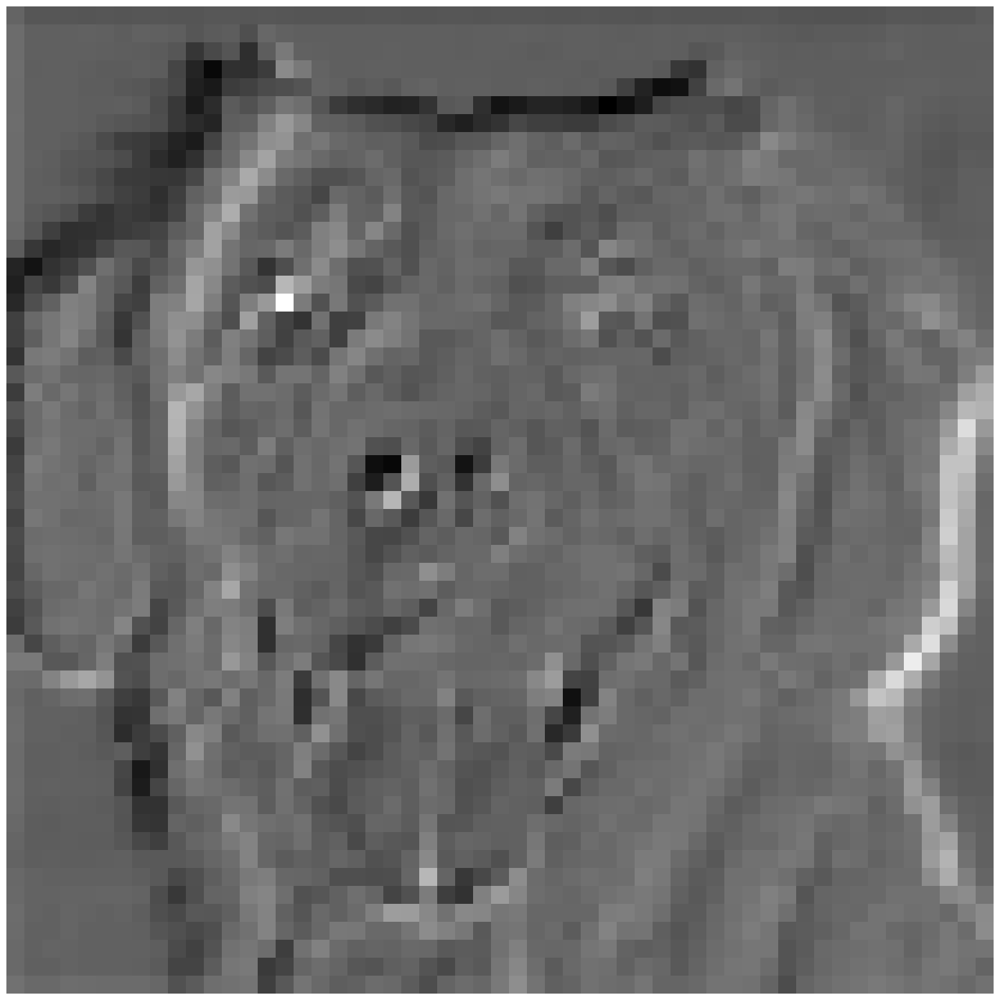

In [ ]:
plot(out[0,0,:,:])

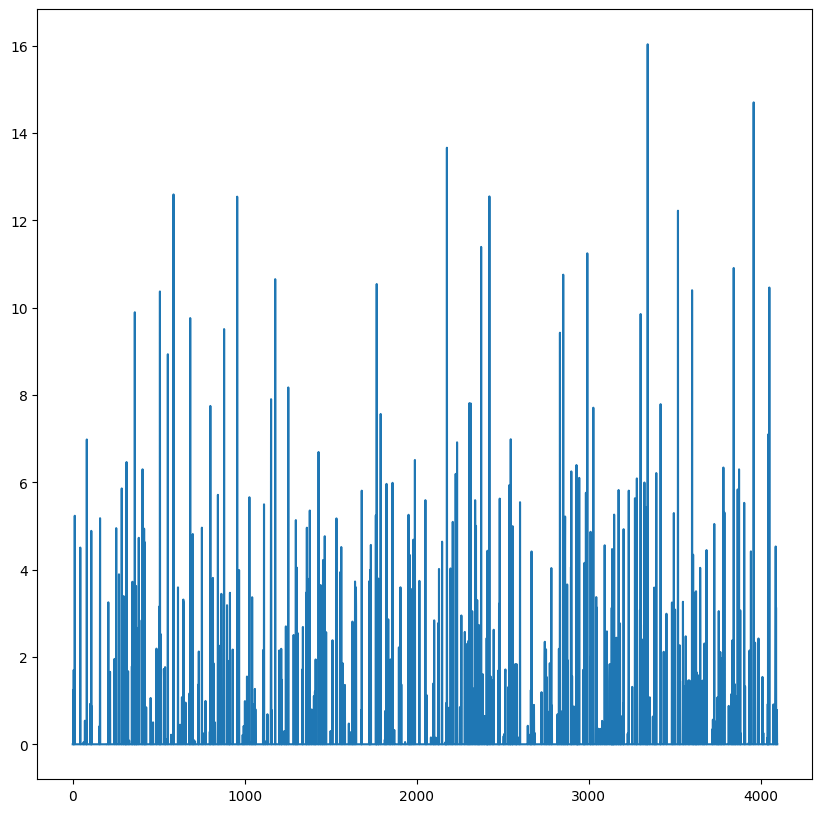

In [ ]:
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
fig = plt.gcf()
fig.set_size_inches(10, 10)

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


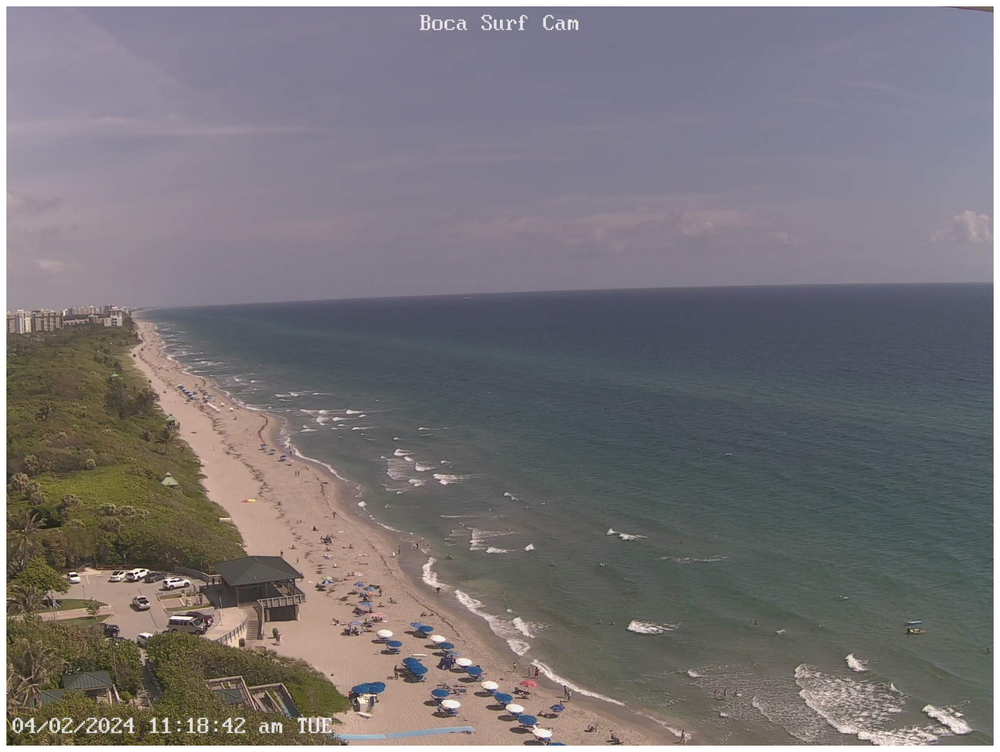

In [ ]:
plot(im)

In [ ]:
def load_im(im):
    image = Image.fromarray(im) #convert to pil
    img_tensor = preprocess(image)
    img_tensor = img_tensor.unsqueeze_(0)
    img_variable = torch.tensor(img_tensor).cuda(0)
    return img_variable

In [ ]:
out = net(load_im(im))

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
def inference(im):
    out = net(load_im(im))
    label_index = out.cpu().data.numpy().argmax()
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
    print(labels[label_index])
    print('____')
    for i in range(10):
        print(labels[top_list[i]])

In [ ]:
inference(im)

seashore, coast, seacoast, sea-coast
____
seashore, coast, seacoast, sea-coast
promontory, headland, head, foreland
sandbar, sand bar
breakwater, groin, groyne, mole, bulwark, seawall, jetty
cliff, drop, drop-off
valley, vale
lakeside, lakeshore
alp
volcano
dalmatian, coach dog, carriage dog


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [1]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
from fastai.callback.wandb import *
import wandb as wb

#Imports libraries which contain various code/functions to make writing code quicker

In [2]:
wb.login(key="")

#Added API key hoping it would fix issue in last cell; seemed to help but still disconnects. Sometimes it disconnects here.

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [38]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") #allows PyTorch to utilize CUDA for accelerated computation

def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=device) #Creates PyTorch tensor. Ensures they are properly allocated.

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=device) #Data only tensor.

def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()

#simple plot that displays grayscale image by input array "x."

def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

#Facilitates retrieval of a URL

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

#Converts slides into images

def load(image, size=224):
    means = [0.485, 0.456, 0.406]
    stds = [0.229, 0.224, 0.225]
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.CenterCrop(size),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ])
    tensor = transform(image).unsqueeze(0).to(device)
    tensor.requires_grad = True
    return tensor

#Prepares image for process in a machine learing model.
#means and stds ensures that the pixel values are scaled properly for the neural network.


In [39]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

model = alexnet(weights='DEFAULT').to(device)
model.eval();

#Sets up pre-trained AlexNet model for image classification.

In [5]:
url = "https://docs.google.com/presentation/d/1NgfAjAoWtOST-3JG9k0RehsdopEP-6Vt9JytV91sfh0/edit#slide=id.g2b78f0cdea9_0_87"

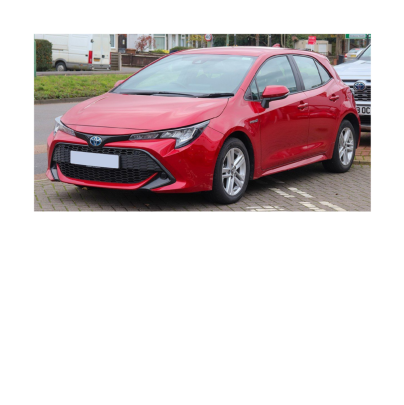

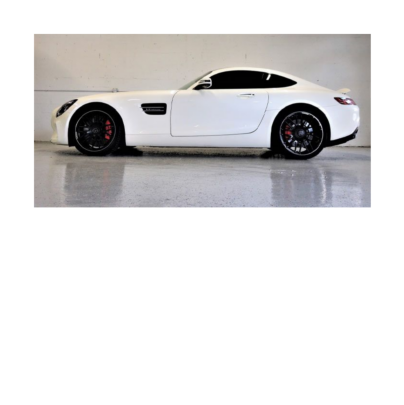

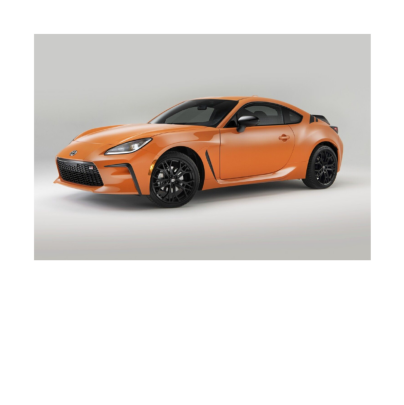

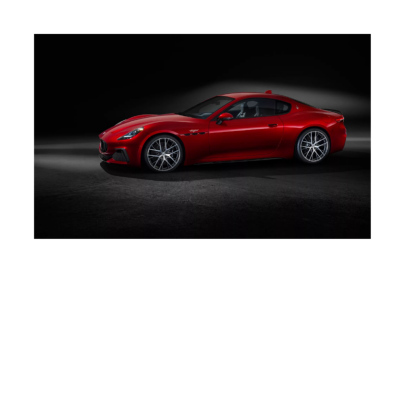

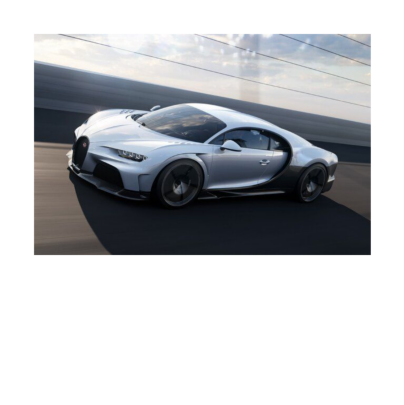

...

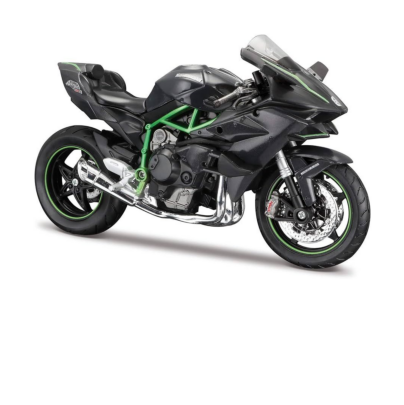

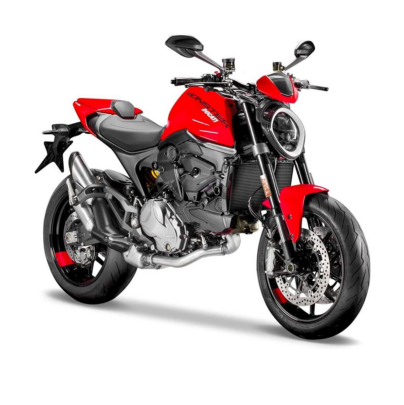

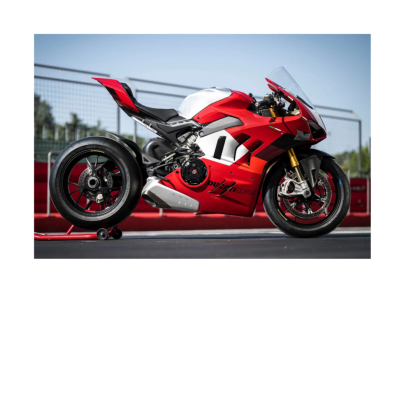

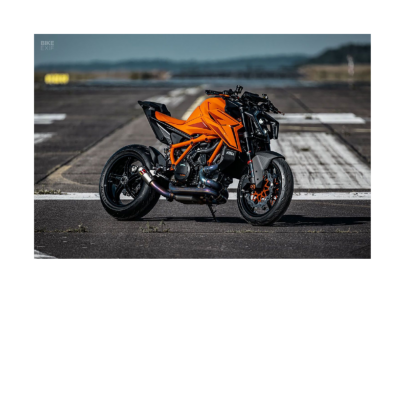

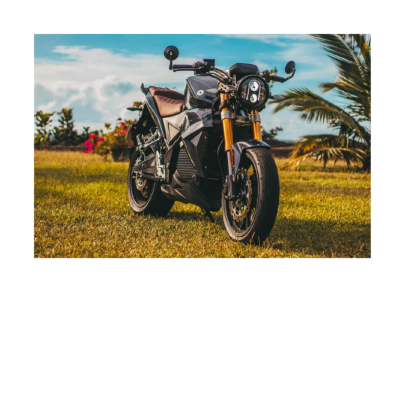

In [6]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)

#Loads and stacks images into a single tensor

In [7]:
images.shape

torch.Size([50, 3, 224, 224])

In [8]:
model(images)

#Computes predictions for each image.

tensor([[-2.4769, -5.7444, -2.8616,  ..., -5.1171, -2.1650,  1.1128],
        [-3.6676, -3.1696, -3.3267,  ..., -5.7966, -2.1542,  4.5941],
        [-4.2121, -4.3031, -4.6587,  ..., -4.0424,  0.3415,  5.0693],
        ...,
        [-4.1733, -3.3212, -6.6747,  ..., -5.2649,  0.0850,  0.1619],
        [-4.2488, -2.0366, -3.9737,  ..., -7.2690, -0.0394,  2.1000],
        [-2.2198, -4.2237, -3.4118,  ..., -4.7475,  0.6668, -0.0941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [9]:
y = model(images)

In [10]:
y.shape

torch.Size([50, 1000])

In [11]:
guesses = torch.argmax(y, 1).cpu().numpy()

In [12]:
for i in list(guesses):
    print(labels[i])

#Displays guess for each image

sports car, sport car
projector
sports car, sport car
sports car, sport car
sports car, sport car
can opener, tin opener
garbage truck, dustcart
CD player
convertible
racer, race car, racing car
half track
sports car, sport car
sports car, sport car
racer, race car, racing car
convertible
limousine, limo
hair slide
limousine, limo
convertible
school bus
pickup, pickup truck
puck, hockey puck
half track
half track
pole
motor scooter, scooter
moped
moped
crash helmet
crash helmet
cassette
moped
go-kart
hair slide
magnetic compass
crash helmet
moped
magnetic compass
hair slide
tricycle, trike, velocipede
crash helmet
mountain bike, all-terrain bike, off-roader
moped
moped
magnetic compass
magnetic compass
motor scooter, scooter
racer, race car, racing car
crash helmet
tractor


In [13]:
Y = np.zeros(50,)
Y[25:] = 1

#Create array of 50, split in the middle

In [14]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [15]:
X = y.detach().cpu().numpy()

#Converts PyTorch tensor on GPU to NumPy array on the CPU

In [16]:
X.shape

(50, 1000)

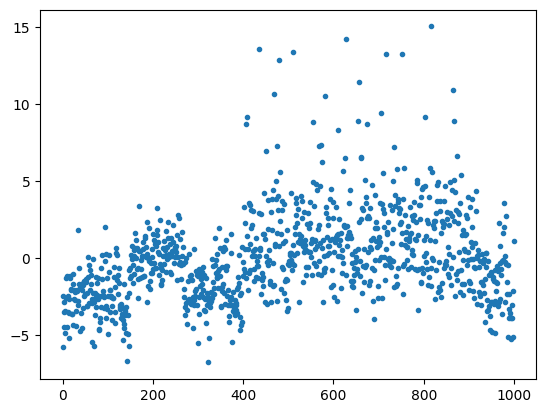

In [17]:
plt.plot(X[0],'.')

In [18]:
X[0]

array([-2.47692013e+00, -5.74439573e+00, -2.86162329e+00, -4.47626114e+00,
       -3.47653794e+00, -4.86338615e+00, -3.42074800e+00, -2.58812857e+00,
       -1.27363944e+00, -1.13563585e+00, -4.48740625e+00, -2.44167423e+00,
       -3.50442052e+00, -3.57996130e+00, -2.62076187e+00, -5.18108082e+00,
       -1.14515638e+00, -1.27303004e+00, -2.01106787e+00, -2.09913349e+00,
       -3.60572672e+00, -3.59352589e+00, -4.34109592e+00, -1.05668807e+00,
       -1.69857776e+00, -2.64217591e+00, -2.06067038e+00, -2.74367332e+00,
       -2.17284894e+00, -4.40638256e+00, -3.40688705e+00, -2.08287930e+00,
       -2.14357710e+00, -3.06734419e+00,  1.83883572e+00, -2.80313897e+00,
       -6.25779092e-01, -1.66987872e+00, -4.70011806e+00, -1.95008266e+00,
       -1.94322777e+00, -3.57951641e+00, -2.08987045e+00, -4.52544069e+00,
       -3.23343825e+00, -1.72121000e+00, -1.63662457e+00, -1.48690999e+00,
       -2.44610929e+00, -1.47333503e+00, -2.33277583e+00, -1.35378563e+00,
       -1.52857506e+00, -

In [19]:
np.argmax(X[0])

817

In [20]:
labels[665]

'moped'

In [21]:
top_ten = np.argsort(X[0])[::-1][0:10]

#Grabs top 10 largest values in array X[0]

In [22]:
for i in top_ten:
    print(labels[i])

sports car, sport car
limousine, limo
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
convertible
pickup, pickup truck
racer, race car, racing car
car wheel
minivan
tow truck, tow car, wrecker
cab, hack, taxi, taxicab


In [23]:
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 24., 174., 313., 284., 141.,  35.,  10.,  10.,   2.,   7.]),
 array([-6.77081347, -4.59057093, -2.41032839, -0.2300857 ,  1.95015693,
         4.1303997 ,  6.31064224,  8.49088478, 10.67112732, 12.85136986,
        15.0316124 ]),
 <BarContainer object of 10 artists>)

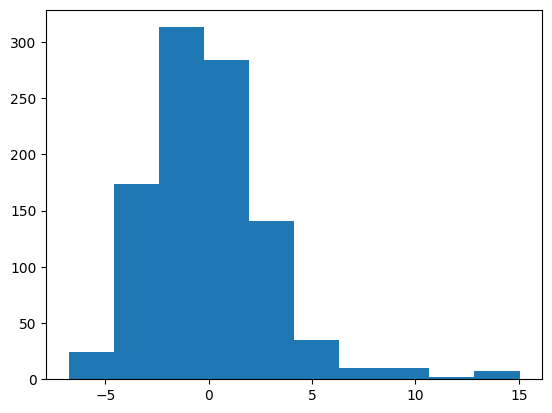

In [24]:
plt.hist(X[0])

In [25]:
X = GPU_data(X)
Y = GPU_data(Y)

#Converts to PyTorch tensors.

In [26]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

#Computes softmax activation for each row of tensor "x."

#Softmax, called softmax activation function, involves:
#computing each exponential of the input tensor
#dividing each exponential value by the sum of all exponentials
#subtracting max values to help stability

In [27]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

#Computes cross entropy loss, commonly used in classification. Punishes model based on difference between target labels and guesses. Lower value = better perfomance

In [28]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

#Transform standard normal samples into a truncated specific range. Approximately [e^-2, ∞)
#Implements the Box-Mueller method to dp so. Relies on relationship between polar coordinates and standard normal deviation.
#Inverse transform to generate samples from standard normal distribution.

In [29]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

#Calculates accuracy of the predictions by comparing with labels. Returns correct predictions as a percentage. Gradients are ignored.

In [30]:
X.shape

torch.Size([50, 1000])

In [31]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

#Computes creation of data batches from training/testing the data.
#Randomly samples data to prevent bias.
#Array indexing in order to select the subset of data for each batch.

In [32]:
def model(x,w):

    return x@w[0]


In [33]:
def make_plots():

    acc_train = acc(model(x,w),y)

    wb.log({"acc_train": acc_train})

#

In [42]:
wb.init(project="Linear_Model_Photo_2");
c = wb.config

c.h = 0.001
c.b = 4
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    wb.log({"loss": loss})

    make_plots()

#runs previosly defined cells

#colab runtime keeps disconnecting on this cell, even after sending API key. Doesn't show any errors.
#Either crashes at wb.init, or processe some lines and then crashes. Only way to reconnect in by restarting runtime.


acc_train,▁█▁█████████▁██▁▁███▁▁█▁██▁██▁████▁███▁█
loss,█▁█▁▁▁▁▁▁▁▁▁█▁▁██▁▁▁██▁█▁▁█▁▁█▁▁▁▁█▁▁▁█▁
acc_train,0.75
loss,0.56326


<ipython-input-38-c0972f0ceb65>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float, device=device) #Creates PyTorch tensor. Ensures they are properly allocated.


TypeError: AlexNet.forward() takes 2 positional arguments but 3 were given

In [40]:
url = "https://docs.google.com/presentation/d/1Wav2gWyjP9_qwqPxvvBije2OI0ZlWvQ5u4m_9QMtEG8/edit#slide=id.g1f7f58ffdfd_0_1"

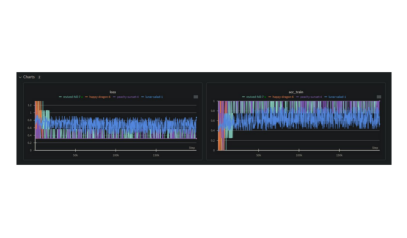

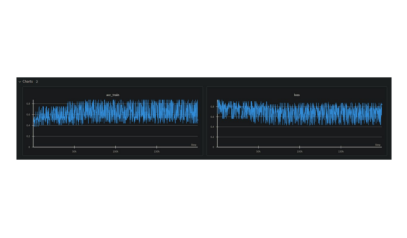

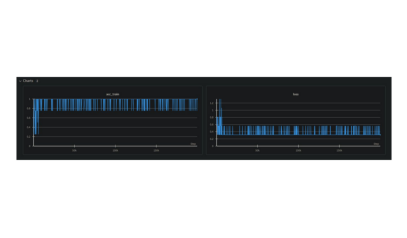

In [41]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)